# **DATA VISUALIZATION**

# **LAPD Crime Analysis**


## **Team Members**

FNU Aditi

Dinesh Motati

Gowthami  Gokul

Pradyumna Kaputhimmareddy

Sanskar Bhuwania




In [5]:
import pandas as pd

# Load the dataset
file_path = 'Crime_Data_from_2020_to_Present.csv'
df = pd.read_csv(file_path)
df.head(5)

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,190326475,03/01/2020 12:00:00 AM,03/01/2020 12:00:00 AM,2130,7,Wilshire,784,1,510,VEHICLE - STOLEN,...,AA,Adult Arrest,510.0,998.0,NaN,NaN,1900 S LONGWOOD AV,NaN,34.0375,-118.3506
1,200106753,02/09/2020 12:00:00 AM,02/08/2020 12:00:00 AM,1800,1,Central,182,1,330,BURGLARY FROM VEHICLE,...,IC,Invest Cont,330.0,998.0,NaN,NaN,1000 S FLOWER ST,NaN,34.0444,-118.2628
2,200320258,11/11/2020 12:00:00 AM,11/04/2020 12:00:00 AM,1700,3,Southwest,356,1,480,BIKE - STOLEN,...,IC,Invest Cont,480.0,NaN,NaN,NaN,1400 W 37TH ST,NaN,34.0210,-118.3002
3,200907217,05/10/2023 12:00:00 AM,03/10/2020 12:00:00 AM,2037,9,Van Nuys,964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),...,IC,Invest Cont,343.0,NaN,NaN,NaN,14000 RIVERSIDE DR,NaN,34.1576,-118.4387
4,220614831,08/18/2022 12:00:00 AM,08/17/2020 12:00:00 AM,1200,6,Hollywood,666,2,354,THEFT OF IDENTITY,...,IC,Invest Cont,354.0,NaN,NaN,NaN,1900 TRANSIENT,NaN,34.0944,-118.3277


# **Data Pre Processing**

In [6]:
# Drop columns
columns_to_drop = ["DR_NO", "Weapon Used Cd", "Crm Cd 1", "Crm Cd 2", "Crm Cd 3", "Crm Cd 4","Mocodes"]
df.drop(columns=columns_to_drop, inplace=True)

In [7]:
# Replace ' 12:00:00 AM' in date columns
df['Date Rptd'] = df['Date Rptd'].str.replace(' 12:00:00 AM', '', regex=False)
df['DATE OCC'] = df['DATE OCC'].str.replace(' 12:00:00 AM', '', regex=False)

# Convert to datetime
df['Date Rptd'] = pd.to_datetime(df['Date Rptd'], format='%m/%d/%Y', errors='coerce')
df['DATE OCC'] = pd.to_datetime(df['DATE OCC'], format='%m/%d/%Y', errors='coerce')

In [8]:
# Merge two columns for address
df['address'] = df['LOCATION'].fillna('') + ' ' + df['Cross Street'].fillna('')
df['address'] = df['address'].str.replace(r'\s+', ' ', regex=True)

# Drop old address columns
df.drop(columns=['LOCATION', 'Cross Street'], inplace=True)

In [9]:
# Rename all columns
new_column_names = ['DateRptd', 'DateOcc', 'TimeOcc', 'AreaCd', 'AreaName', 'RptDistNo', 'CrimeType',
                    'CrmCd', 'CrmCdDesc', 'VictAge', 'VictSex', 'VictDescent',
                    'PremisCd', 'PremisDesc', 'Weapon', 'Status', 'StatusDesc',
                    'Latitude', 'Longitude', 'Address']
df.columns = new_column_names

In [10]:
# Map 'VictDescent' column
descent_mapping = {
    'A': 'Other Asian',
    'B': 'Black',
    'C': 'Chinese',
    'D': 'Cambodian',
    'F': 'Filipino',
    'G': 'Guamanian',
    'H': 'Hispanic/Latin/Mexican',
    'I': 'American Indian/Alaskan Native',
    'J': 'Japanese',
    'K': 'Korean',
    'L': 'Laotian',
    'O': 'Other',
    'P': 'Pacific Islander',
    'S': 'Samoan',
    'U': 'Hawaiian',
    'V': 'Vietnamese',
    'W': 'White',
    'X': 'None',
    'Z': 'Asian Indian',
    'None': 'Other',
    '-': 'Other'
}
df['VictDescent'] = df['VictDescent'].map(descent_mapping).fillna('Other')

In [11]:
# Replace blank values in 'VictDescent' column
df['VictDescent'] = df['VictDescent'].replace('', 'NULL')

In [12]:
# Count unique values in 'VictDescent' and 'VictSex'
print(df['VictDescent'].value_counts())
print(df['VictSex'].value_counts())

VictDescent
Hispanic/Latin/Mexican            292430
Other                             215169
White                             197125
Black                             134182
None                              103330
Other Asian                        21028
Korean                              5678
Filipino                            4555
Chinese                             4265
Japanese                            1490
Vietnamese                          1117
American Indian/Alaskan Native       968
Asian Indian                         529
Pacific Islander                     277
Hawaiian                             211
Cambodian                             86
Guamanian                             72
Laotian                               71
Samoan                                55
Name: count, dtype: int64
VictSex
M    396769
F    352750
X     94561
H       112
-         1
Name: count, dtype: int64


In [13]:
# Clean 'VictSex' column
df['VictSex'] = df['VictSex'].replace({'H': 'X', '-': 'X'}).fillna('NULL')

In [14]:
# Count unique values in 'Weapon' column
print(df['Weapon'].value_counts())

# Replace null in 'Weapon'
df['Weapon'] = df['Weapon'].fillna('NO WEAPON INFO')

# Drop rows with null values in 'PremisCd' or 'PremisDesc'
df.dropna(subset=['PremisCd', 'PremisDesc'], inplace=True)

Weapon
STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)    174413
UNKNOWN WEAPON/OTHER WEAPON                        35945
VERBAL THREAT                                      23802
HAND GUN                                           20107
SEMI-AUTOMATIC PISTOL                               7246
                                                   ...  
MAC-11 SEMIAUTOMATIC ASSAULT WEAPON                    3
HECKLER & KOCH 91 SEMIAUTOMATIC ASSAULT RIFLE          2
MAC-10 SEMIAUTOMATIC ASSAULT WEAPON                    2
M-14 SEMIAUTOMATIC ASSAULT RIFLE                       2
M1-1 SEMIAUTOMATIC ASSAULT RIFLE                       1
Name: count, Length: 79, dtype: int64


In [15]:
# Check for null values in each column
null_counts = df.isnull().sum()
print(null_counts)

DateRptd       0
DateOcc        0
TimeOcc        0
AreaCd         0
AreaName       0
RptDistNo      0
CrimeType      0
CrmCd          0
CrmCdDesc      0
VictAge        0
VictSex        0
VictDescent    0
PremisCd       0
PremisDesc     0
Weapon         0
Status         0
StatusDesc     0
Latitude       0
Longitude      0
Address        0
dtype: int64


In [16]:
import pandas as pd

# Load the dataset
file_path = 'Cleaned_Crime_Data.csv'
crime_data = pd.read_csv(file_path)

# Check the first few rows to confirm loading
crime_data.head()


,DateRptd,DateOcc,TimeOcc,AreaCd,AreaName,RptDistNo,CrimeType,CrmCd,CrmCdDesc,VictAge,VictSex,VictDescent,PremisCd,PremisDesc,Weapon,Status,StatusDesc,Latitude,Longitude,Address
0,01-03-2020,01-03-2020,2130,7,Wilshire,784,1,510,VEHICLE - STOLEN,0,M,Other,101,STREET,NO WEAPON INFO,AA,Adult Arrest,34.0375,-118.3506,1900 S LONGWOOD AV
1,09-02-2020,08-02-2020,1800,1,Central,182,1,330,BURGLARY FROM VEHICLE,47,M,Other,128,BUS STOP/LAYOVER (ALSO QUERY 124),NO WEAPON INFO,IC,Invest Cont,34.0444,-118.2628,1000 S FLOWER ST
2,11-11-2020,04-11-2020,1700,3,Southwest,356,1,480,BIKE - STOLEN,19,X,NaN,502,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NO WEAPON INFO,IC,Invest Cont,34.0210,-118.3002,1400 W 37TH ST
3,10-05-2023,10-03-2020,2037,9,Van Nuys,964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),19,M,Other,405,CLOTHING STORE,NO WEAPON INFO,IC,Invest Cont,34.1576,-118.4387,14000 RIVERSIDE DR
4,18-08-2022,17-08-2020,1200,6,Hollywood,666,2,354,THEFT OF IDENTITY,28,M,Hispanic/Latin/Mexican,102,SIDEWALK,NO WEAPON INFO,IC,Invest Cont,34.0944,-118.3277,1900 TRANSIENT


# **Exploratory Data Analysis**

### **How do seasonal variations influence crime occurrences, and are there particular types of crimes that demonstrate notable spikes during specific months or seasons, revealing deeper patterns in criminal behavior?**


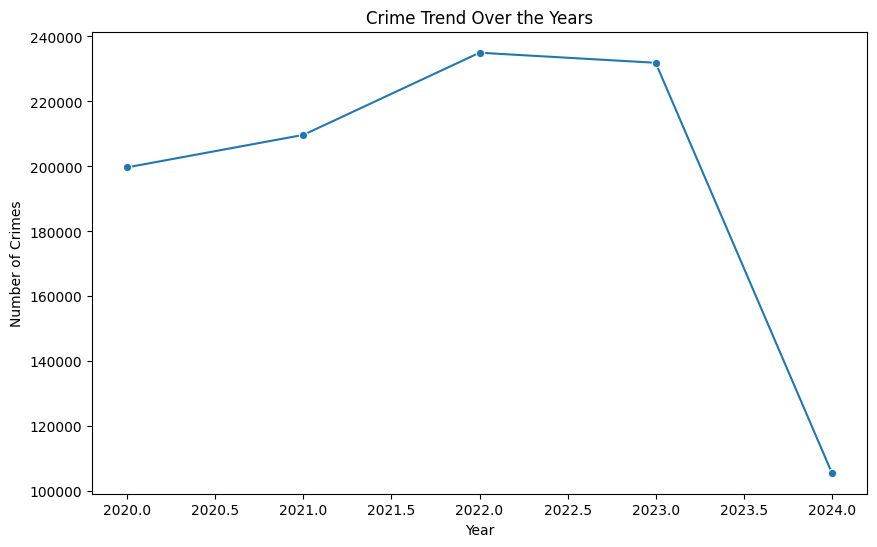

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# Convert the 'date' column to datetime format
crime_data['DateOcc'] = pd.to_datetime(crime_data['DateOcc'], format='%d-%m-%Y')

crime_data['year'] = crime_data['DateOcc'].dt.year
# Crime trend over years
crime_by_year = crime_data.groupby('year').size()
plt.figure(figsize=(10, 6))
sns.lineplot(x=crime_by_year.index, y=crime_by_year.values, marker="o")
plt.title("Crime Trend Over the Years")
plt.xlabel("Year")
plt.ylabel("Number of Crimes")
plt.show()


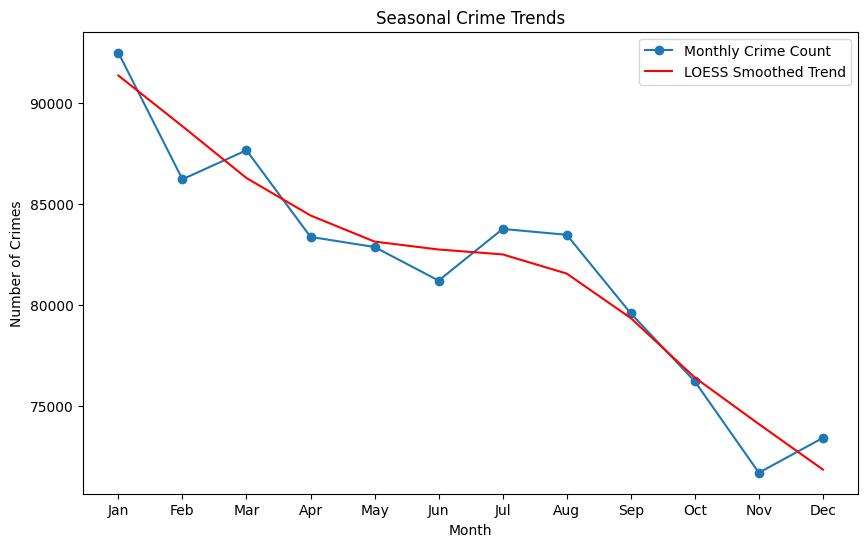

In [18]:
import statsmodels.api as sm

crime_data['month'] = crime_data['DateOcc'].dt.month
# Seasonal trend with LOESS smoothing
crime_by_month = crime_data.groupby('month').size()
lowess = sm.nonparametric.lowess
trend = lowess(crime_by_month.values, crime_by_month.index, frac=0.5)

plt.figure(figsize=(10, 6))
plt.plot(crime_by_month.index, crime_by_month.values, label="Monthly Crime Count", marker="o")
plt.plot(crime_by_month.index, trend[:, 1], label="LOESS Smoothed Trend", color='red')
plt.title("Seasonal Crime Trends")
plt.xlabel("Month")
plt.ylabel("Number of Crimes")
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend()
plt.show()


<ipython-input-31-e0bf75d46005>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



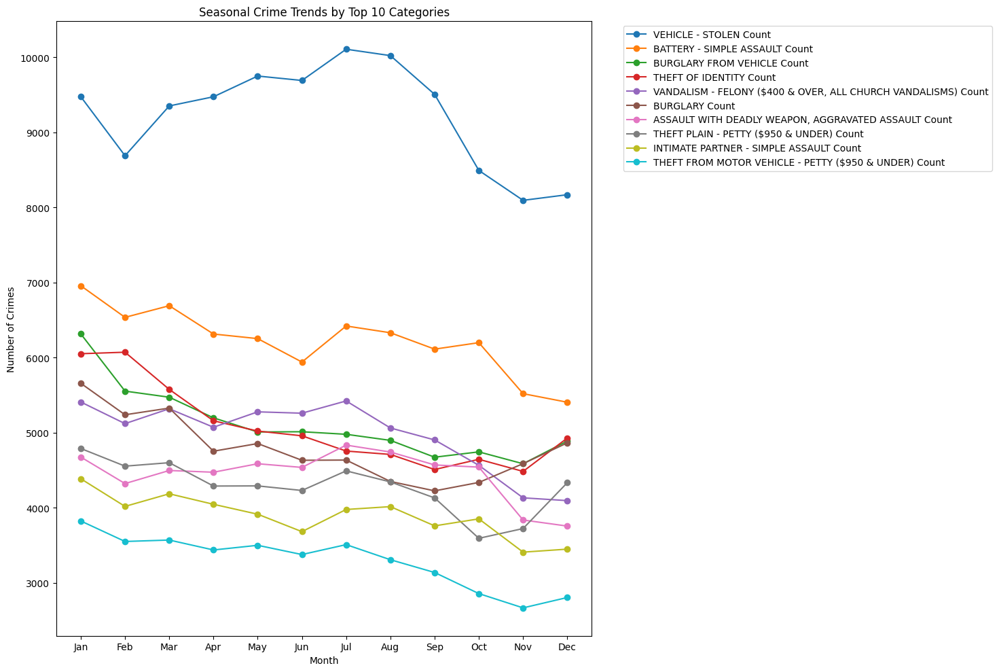

In [31]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Identify top 10 crime categories
top_10_categories = crime_data['CrmCdDesc'].value_counts().nlargest(10).index

# Step 2: Filter data for top 10 categories
filtered_crime_data = crime_data[crime_data['CrmCdDesc'].isin(top_10_categories)]

# Step 3: Group data by month and crime category
filtered_crime_data['month'] = filtered_crime_data['DateOcc'].dt.month
crime_by_category_and_month = filtered_crime_data.groupby(['CrmCdDesc', 'month']).size().unstack(fill_value=0)

# Step 4: Plot seasonal trends for each top crime category
plt.figure(figsize=(15, 10))
for category in top_10_categories:
    crime_by_month = crime_by_category_and_month.loc[category]

    plt.plot(crime_by_month.index, crime_by_month.values, label=f"{category} Count", marker="o")

# Step 5: Customize the plot
plt.title("Seasonal Crime Trends by Top 10 Categories")
plt.xlabel("Month")
plt.ylabel("Number of Crimes")
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


### **How do patterns in crime rates vary across different demographic groups, such as age, gender, and ethnicity, and what insights can be drawn about the social dynamics influencing these variations?**

In [19]:
# Extract the top 10 crime categories
top_10_crime_categories = crime_data['CrmCdDesc'].value_counts().nlargest(10).index

# Create a new column with only the top 10 categories
crime_data['TopCategories'] = crime_data['CrmCdDesc'].where(crime_data['CrmCdDesc'].isin(top_10_crime_categories))


<ipython-input-20-8aa25205f7f5>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


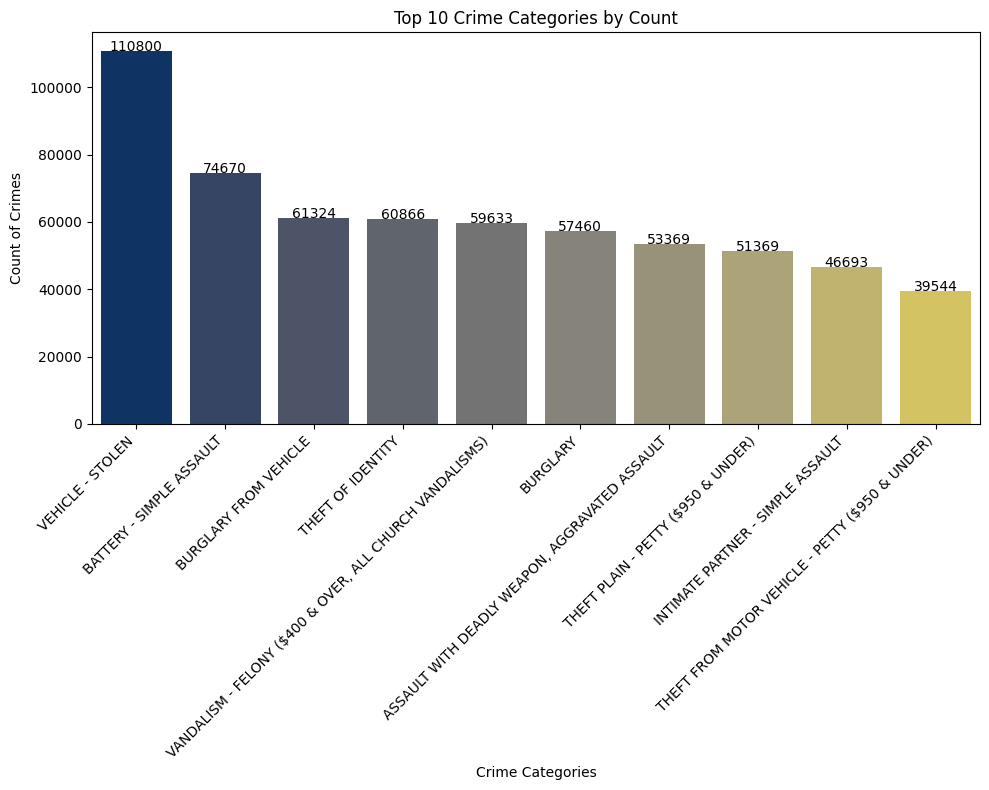

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

# Distribution of crime categories
crime_category_counts = crime_data['TopCategories'].value_counts()

# Select the top 10 crime categories
top_10_crime_categories = crime_category_counts.nlargest(10)

# Create a bar chart using Seaborn
plt.figure(figsize=(10, 8))
sns.barplot(
    x=top_10_crime_categories.index,
    y=top_10_crime_categories.values,
    palette="cividis"
)

# Add text annotations on each bar
for i, count in enumerate(top_10_crime_categories.values):
    plt.text(i, count + 2, str(count), ha='center', fontsize=10)

# Add labels and title
plt.title("Top 10 Crime Categories by Count")
plt.xlabel("Crime Categories")
plt.ylabel("Count of Crimes")
plt.xticks(rotation=45, ha='right', fontsize=10)

plt.tight_layout()

# Show the chart
plt.show()


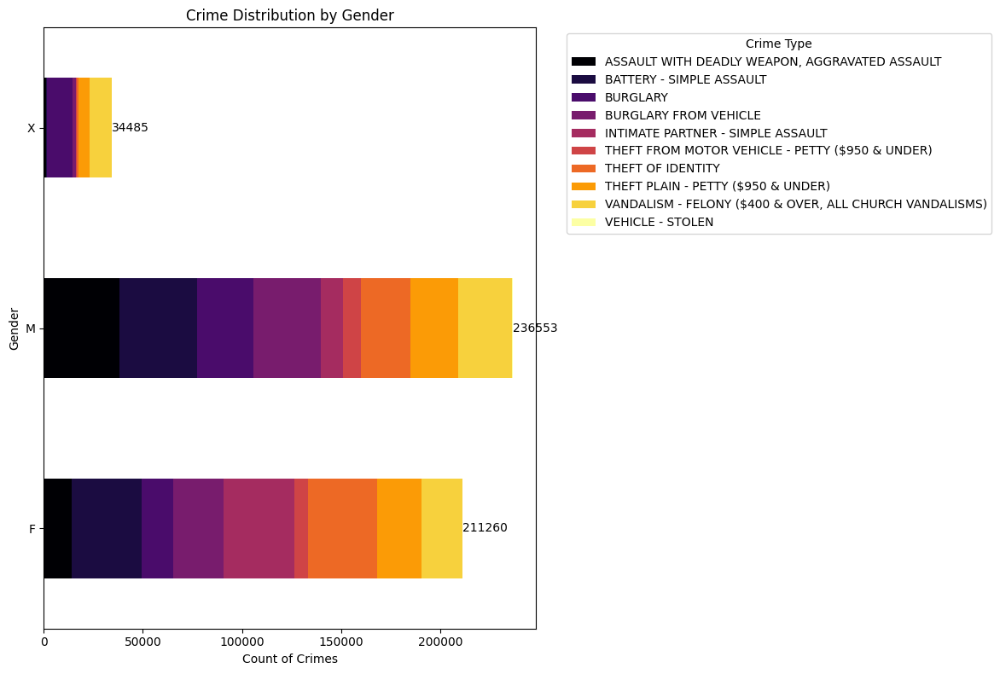

In [21]:
import matplotlib.pyplot as plt

# Gender distribution in crimes
gender_distribution = crime_data.groupby(['VictSex', 'TopCategories']).size().unstack(fill_value=0)

# Plot horizontal stacked bar chart
ax = gender_distribution.plot(kind='barh', stacked=True, figsize=(12, 8), colormap='inferno')
plt.title("Crime Distribution by Gender")
plt.xlabel("Count of Crimes")
plt.ylabel("Gender")
plt.legend(title="Crime Type", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Calculate total counts per gender and annotate them
total_counts = gender_distribution.sum(axis=1)
for i, total in enumerate(total_counts):
    ax.text(
        total + 10,  # x position, slightly to the right of the bar
        i,          # y position
        f"{int(total)}",  # Total count text
        ha='left', va='center', fontsize=10, color="black"
    )

plt.show()


<ipython-input-22-dfc90c01e61e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='TopCategories', y='VictAge', data=crime_data_filtered, palette='viridis')


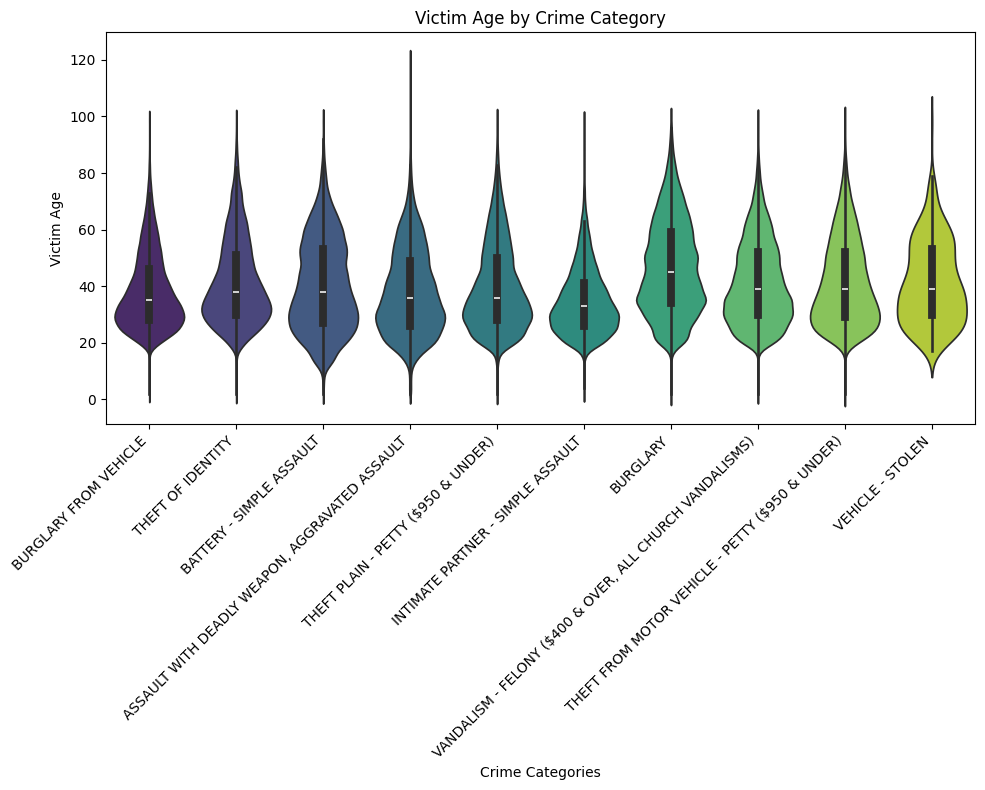

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

# Remove zero ages
crime_data_filtered = crime_data[crime_data['VictAge'] > 0]

# Violin Plot
plt.figure(figsize=(10, 8))
sns.violinplot(x='TopCategories', y='VictAge', data=crime_data_filtered, palette='viridis')
plt.title("Victim Age by Crime Category")
plt.xlabel("Crime Categories")
plt.ylabel("Victim Age")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


<Figure size 1400x800 with 0 Axes>

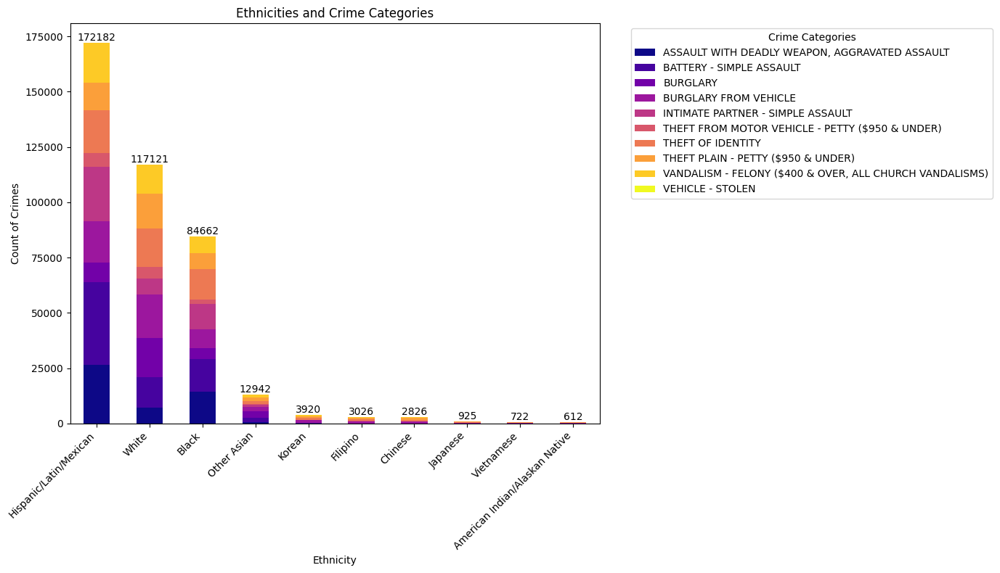

In [23]:
import matplotlib.pyplot as plt
import pandas as pd

# Group data by ethnicity and crime categories
ethnicity_distribution = crime_data.groupby(['VictDescent', 'TopCategories']).size().unstack(fill_value=0)

# Calculate total crimes for each ethnicity and sort them
total_crimes_by_ethnicity = ethnicity_distribution.sum(axis=1).sort_values(ascending=False)

# Select the top 10 ethnicities excluding "Other"
top_ethnicities = total_crimes_by_ethnicity.drop('Other', errors='ignore').nlargest(10).index
ethnicity_distribution_top = ethnicity_distribution.loc[top_ethnicities]

# Plot the stacked bar chart
plt.figure(figsize=(14, 8))
ax = ethnicity_distribution_top.plot(kind='bar', stacked=True, figsize=(14, 8), colormap='plasma')

# Add total counts on top of each bar
for i, ethnicity in enumerate(ethnicity_distribution_top.index):
    total_count = total_crimes_by_ethnicity[ethnicity]
    ax.text(
        i,  # x position
        total_count + 5,  # y position slightly above the top of the bar
        str(total_count),  # total count as text
        ha='center', va='bottom', fontsize=10, color='black'
    )

# Add labels and title
plt.title("Ethnicities and Crime Categories")
plt.xlabel("Ethnicity")
plt.ylabel("Count of Crimes")
plt.xticks(rotation=45, ha='right')
plt.legend(title="Crime Categories", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


### **Do specific regions exhibit a higher concentration of particular types of crimes, and can we identify spatial clusters that reveal underlying patterns of criminal activity such as theft or assault?**

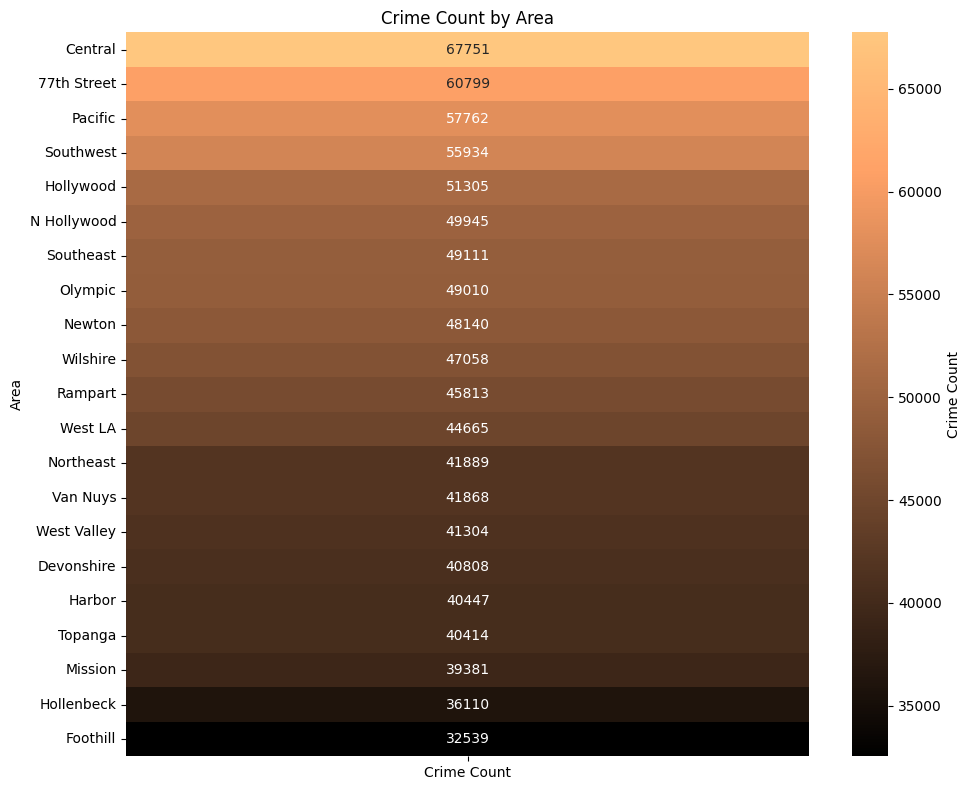

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt

# Group crimes by area
area_crime_counts = crime_data['AreaName'].value_counts()

# Convert to DataFrame for heatmap
area_crime_df = area_crime_counts.reset_index()
area_crime_df.columns = ['Area', 'Crime Count']

# Create the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    area_crime_df.set_index('Area'),  # Set Area as the index for rows
    annot=True,                      # Show numbers in cells
    cmap='copper',                  # Color scheme
    fmt='d',                         # Format as integers
    cbar_kws={'label': 'Crime Count'}  # Label for color bar
)

# Add title
plt.title("Crime Count by Area")
plt.tight_layout()
plt.show()


In [25]:
pip install geopandas folium plotly pandas matplotlib


In [26]:
import folium
from folium.plugins import HeatMap, MarkerCluster

# Filter and optimize the dataset
heatmap_data = crime_data[['Latitude', 'Longitude', 'TopCategories', 'DateOcc']].dropna()

# Optimize data by sampling (reduce size for faster rendering)
heatmap_data = heatmap_data.sample(n=10000, random_state=42)  # Adjust n as needed for performance

# Create a base map centered on Los Angeles
m = folium.Map(location=[34.05, -118.25], zoom_start=10)

# Add a heatmap layer with weights and custom gradient
heatmap_data['crime_weight'] = heatmap_data['TopCategories'].apply(lambda x: 2 if x == 'Severe' else 1)  # Example weighting
heat_data = list(zip(heatmap_data['Latitude'], heatmap_data['Longitude'], heatmap_data['crime_weight']))
HeatMap(
    heat_data,
    radius=10,
    blur=15,
    max_zoom=1,
    gradient={0.2: 'blue', 0.5: 'green', 0.8: 'orange', 1: 'red'}
).add_to(m)

# Add clustered markers with popups for detailed information
marker_cluster = MarkerCluster().add_to(m)
for _, row in heatmap_data.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"""
        <strong>Location:</strong> {row['Latitude']}, {row['Longitude']}<br>
        <strong>Crime:</strong> {row['TopCategories']}<br>
        <strong>Date:</strong> {row['DateOcc']}
        """
    ).add_to(marker_cluster)

# Add layer control for toggling between heatmap and clusters
folium.LayerControl().add_to(m)

# Save the map as an HTML file
m.save("Crime_Map.html")
m

### **What are the dynamics of reporting delays across various crime types, and which categories tend to experience the most significant lag between the occurrence of the crime and its reporting?**

In [27]:
import pandas as pd
import plotly.express as px

# Ensure 'DateRptd' and 'DateOcc' are in datetime format
df['DateRptd'] = pd.to_datetime(df['DateRptd'], errors='coerce')
df['DateOcc'] = pd.to_datetime(df['DateOcc'], errors='coerce')

# Drop rows with missing or invalid dates
df = df.dropna(subset=['DateRptd', 'DateOcc'])

# Calculate time differences in days and filter valid differences
df['TimeDifference'] = (df['DateRptd'] - df['DateOcc']).dt.days.abs()
df = df[df['TimeDifference'] > 0]  # Exclude zero or invalid differences

# Group by 'CrmCdDesc' and calculate the average delay
crime_delay = df.groupby('CrmCdDesc')['TimeDifference'].mean().reset_index()

# Rename columns for clarity
crime_delay.columns = ['Crime Category', 'Average Delay (days)']

# Filter for crime categories with an average delay greater than 30 days
crime_delay = crime_delay[crime_delay['Average Delay (days)'] > 30]

# Check if there are valid data points
if crime_delay.empty:
    print("No valid data for generating the treemap.")
else:
    # Create a treemap using Plotly
    fig = px.treemap(
        crime_delay,
        path=['Crime Category'],  # Hierarchical path
        values='Average Delay (days)',  # Size of each box
        color='Average Delay (days)',  # Color scale based on delay
        color_continuous_scale='earth',
        title='Treemap of Crime Categories with Average Reporting Delay Above 30 Days'
    )

    # Show the treemap
    fig.show()


In [28]:
import pandas as pd
import plotly.express as px

# Assuming df is the Pandas DataFrame containing the data
# Ensure 'DateRptd' and 'DateOcc' are in datetime format
df['DateRptd'] = pd.to_datetime(df['DateRptd'])
df['DateOcc'] = pd.to_datetime(df['DateOcc'])

# Calculate time differences in days
df['TimeDifference'] = (df['DateRptd'] - df['DateOcc']).dt.days.abs()

# Group by 'CrmCdDesc' and calculate mean time difference
mean_time_diff = df.groupby('CrmCdDesc')['TimeDifference'].mean().reset_index()

# Sort by mean time difference in ascending order
mean_time_diff = mean_time_diff.sort_values(by='TimeDifference', ascending=True)

# Take the bottom 20 rows
bottom_20_mean_time_diff = mean_time_diff.head(20)

# Prepare data for radar chart
bottom_20_mean_time_diff = bottom_20_mean_time_diff.set_index('CrmCdDesc')

# Add the first row again at the end to close the radar chart
bottom_20_mean_time_diff.loc['Closing Point'] = bottom_20_mean_time_diff.iloc[0]

# Create a radar chart
fig = px.line_polar(
    bottom_20_mean_time_diff.reset_index(),
    r='TimeDifference',
    theta='CrmCdDesc',
    line_close=True,
    labels={'CrmCdDesc': 'Crime Type', 'TimeDifference': 'Mean Time Difference (days)'},
    title='Immediately Reported Crime Types by Mean Time Difference',
)

# Show the plot
fig.show()


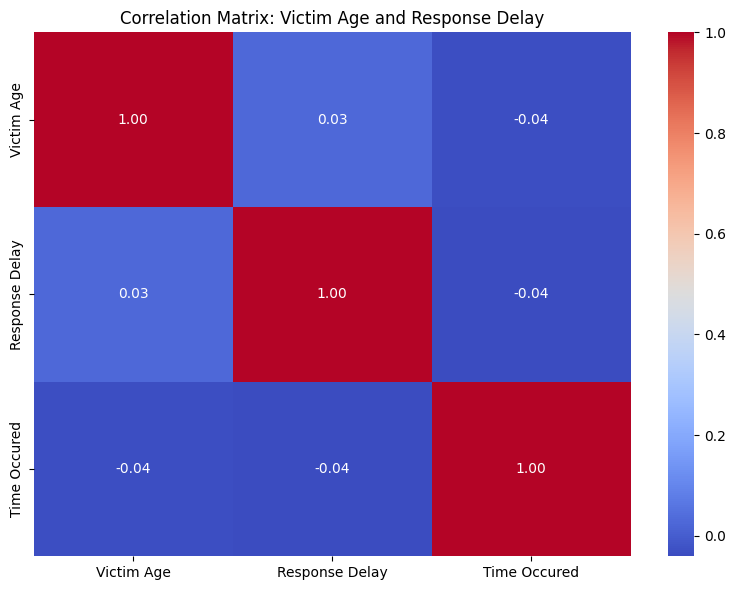

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Convert dates to datetime format with correct format
crime_data['DateRptd'] = pd.to_datetime(crime_data['DateRptd'], errors='coerce', dayfirst=True)
crime_data['DateOcc'] = pd.to_datetime(crime_data['DateOcc'], errors='coerce', dayfirst=True)

# Calculate response delay in crime reporting
crime_data['ResponseDelay'] = (crime_data['DateRptd'] - crime_data['DateOcc']).dt.days

# Drop rows with NaN values in relevant columns
correlation_data = crime_data[['VictAge', 'ResponseDelay','TimeOcc']].dropna()

# Compute the correlation matrix
correlation_matrix = correlation_data.corr()

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', cbar=True,
            xticklabels=['Victim Age', 'Response Delay','Time Occured'], yticklabels=['Victim Age', 'Response Delay','Time Occured'])
plt.title("Correlation Matrix: Victim Age and Response Delay")
plt.tight_layout()
plt.show()
